# Spectrogram analysis

## Necessary imports

In [2]:
import os
import numpy as np
import pandas as pd
import librosa
import matplotlib.pyplot as plt
import soundfile as sf 
import re
from scipy import signal
from scipy.io import wavfile
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
import seaborn as sns
from functools import reduce

## Audio file partition 

In [2]:
DATASET_PATH = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/genres_original"
OUTPUT_PATH = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/genres_split"  # Nowa lokalizacja dla fragmentów

# Długość fragmentu w sekundach
segment_duration = 3  # W sekundy (3 sekundy)

# Przechodzimy przez foldery i pliki
for label in os.listdir(DATASET_PATH):
    label_path = os.path.join(DATASET_PATH, label)
    output_label_path = os.path.join(OUTPUT_PATH, label)

    if not os.path.isdir(label_path):  # Sprawdzamy, czy to folder
        continue

    # Tworzymy folder dla etykiety, jeśli nie istnieje
    if not os.path.exists(output_label_path):
        os.makedirs(output_label_path)

    for file in os.listdir(label_path):
        if file.endswith('.wav'):
            file_path = os.path.join(label_path, file)

            # Wczytanie pliku audio z oryginalną częstotliwością próbkowania
            signal, sr = librosa.load(file_path, sr=None)  # Wczytanie pliku z oryginalnym sample rate
            total_samples = len(signal)

            # Liczba próbek na 3-sekundowy fragment
            samples_per_segment = segment_duration * sr

            # Podziel plik na 3-sekundowe fragmenty
            num_segments = total_samples // samples_per_segment

            for i in range(num_segments):
                start_idx = i * samples_per_segment
                end_idx = start_idx + samples_per_segment
                segment = signal[start_idx:end_idx]

                # Zapisz fragment jako nowy plik audio
                segment_filename = f"{os.path.splitext(file)[0]}_part{i+1}.wav"
                segment_file_path = os.path.join(output_label_path, segment_filename)

                # Zapisujemy 3-sekundowy fragment
                sf.write(segment_file_path, segment, sr)
print("Zakończono dzielenie plików na 3-sekundowe fragmenty.")


Zakończono dzielenie plików na 3-sekundowe fragmenty.


## Amplitude(in time)

In [125]:
DATASET_PATH = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/genres_split"

# Nowa częstotliwość próbkowania (zmniejszenie dokładności)
new_sr = 205  # Nowa częstotliwość próbkowania (np. połowa oryginalnej) #było 5025

# Liczba piosenek do wczytania
num_songs_to_process = 100  # Ustal liczbę piosenek, które chcesz przetworzyć

# Lista cech do zapisania
features = []

# Licznik przetworzonych piosenek
song_count = 0

# Przechodzimy przez foldery i pliki
for label in os.listdir(DATASET_PATH):
    label_path = os.path.join(DATASET_PATH, label)
    
    if not os.path.isdir(label_path):  # Sprawdzamy, czy to folder
        continue
    
    files = sorted(
    [f for f in os.listdir(label_path) if f.endswith('.wav')],
    key=lambda x: [int(num) if num.isdigit() else num for num in re.findall(r'\d+|\D+', x)])


    for file in files: #os.listdir(label_path):
        if file.endswith('.wav') and song_count < num_songs_to_process:  # Obsługujemy pliki audio i sprawdzamy licznik
            file_path = os.path.join(label_path, file)

            # Wczytanie pliku audio z nową częstotliwością próbkowania
            signal, sr = librosa.load(file_path, sr=new_sr)  # Wczytanie z nowym sample rate
            duration = len(signal) / sr  # Czas trwania w sekundach
            time_axis = np.linspace(0, duration, len(signal))  # Oś czasu (1 sekunda = len(signal) próbek)

            # Dodanie cech do listy
            features.append([file, label] + list(signal))

            # Zwiększenie licznika piosenek
            #song_count += 1

        # Jeśli osiągnięto liczbę piosenek, przerywamy`
        #if song_count >= num_songs_to_process:
           # break

    # Jeśli osiągnięto liczbę piosenek, przerywamy
    #if song_count >= num_songs_to_process:
        #break

# Tworzenie DataFrame z próbkami w czasie
columns = ["filename", "label"] + [f"waveform_sample_{i}" for i in range(len(features[0]) - 2)]  # Kolumny = próbek
df = pd.DataFrame(features, columns=columns)

# Zapis do CSV
csv_path = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/waveform_data.csv"
df.to_csv(csv_path, index=False)

print(f"Zapisano dane do: {csv_path}")

Zapisano dane do: data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/waveform_data.csv


In [126]:
# Wczytanie danych z CSV
df = pd.read_csv("data\\datasets\\andradaolteanu\\gtzan-dataset-music-genre-classification\\versions\\1\\Data\\waveform_data.csv")

In [127]:
df

,filename,label,waveform_sample_0,waveform_sample_1,waveform_sample_2,waveform_sample_3,waveform_sample_4,waveform_sample_5,waveform_sample_6,waveform_sample_7,...,waveform_sample_605,waveform_sample_606,waveform_sample_607,waveform_sample_608,waveform_sample_609,waveform_sample_610,waveform_sample_611,waveform_sample_612,waveform_sample_613,waveform_sample_614
0,blues.00000_part1.wav,blues,-0.010872,-0.021163,0.001855,0.019416,-0.004656,-0.017819,-0.010939,0.016582,...,-0.024534,0.035085,-0.028758,0.005355,-0.031110,0.035154,-0.009719,0.006218,-0.028523,0.008918
1,blues.00000_part2.wav,blues,-0.028716,0.023554,-0.015085,-0.011728,0.000425,0.009788,0.007500,-0.000906,...,-0.051464,0.013388,0.025798,-0.004274,-0.019546,0.045096,-0.088248,0.087217,-0.023235,-0.102808
2,blues.00000_part3.wav,blues,0.033131,0.076180,-0.117582,-0.070799,0.100265,0.105164,-0.178126,-0.051062,...,0.017876,0.025039,0.002566,-0.036577,0.024868,0.019794,-0.031767,0.015434,-0.001693,0.027644
3,blues.00000_part4.wav,blues,0.021130,-0.001411,-0.020748,0.028537,-0.005073,0.020415,0.002052,-0.027417,...,0.032280,-0.031542,-0.014356,0.024149,-0.009315,0.004037,-0.022953,0.023716,-0.024748,0.024869
4,blues.00000_part5.wav,blues,0.026854,0.003281,-0.021121,0.015413,0.004264,-0.005853,-0.004475,-0.001018,...,0.042643,-0.070786,-0.029178,0.023838,0.064893,-0.053488,-0.027733,0.003534,0.063333,-0.051685
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9976,rock.00099_part6.wav,rock,0.012009,-0.028633,0.012451,0.016590,-0.022451,-0.001588,0.022123,-0.010822,...,-0.018165,-0.009205,0.020987,0.004150,-0.025126,0.006756,0.020168,-0.010445,-0.019534,0.018269
9977,rock.00099_part7.wav,rock,-0.010569,-0.012291,-0.011352,0.025378,-0.004073,-0.016269,0.004542,0.011952,...,0.039030,-0.035059,0.020863,0.000294,-0.022090,0.035593,-0.035348,0.026119,-0.009496,-0.011107
9978,rock.00099_part8.wav,rock,0.002339,-0.028929,0.024844,-0.011390,-0.007132,0.026340,-0.039627,0.038858,...,0.015683,0.019409,-0.049195,0.067874,-0.063955,0.014118,0.069325,-0.117258,0.078723,-0.007887
9979,rock.00099_part9.wav,rock,-0.029087,-0.012342,0.001918,0.043307,-0.035460,-0.015079,0.034570,-0.039466,...,-0.008982,0.036394,-0.049939,0.048016,-0.029251,0.000494,0.024109,-0.037813,0.038481,-0.024150


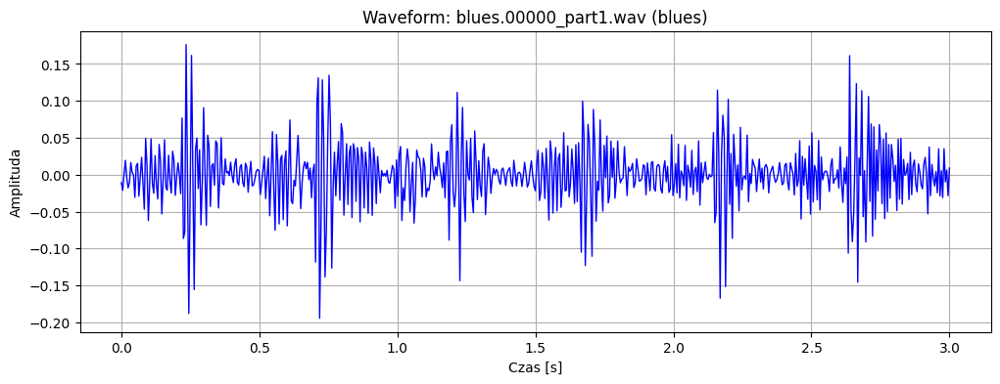

In [128]:
# Wybór pliku do wizualizacji (np. pierwszy wiersz)
row = df.iloc[0]  # Możesz zmienić indeks na inny plik
# Pobranie nazwy pliku i etykiety
filename = row["filename"]
label = row["label"]

# Pobranie wartości amplitudy
samples = row.iloc[2:].values  # Pomijamy kolumny "filename" i "label"
# Tworzenie osi czasu (zakładając stałą częstotliwość próbkowania)
time = np.linspace(0, len(samples) / sr, len(samples))  # Oś czasu w sekundach
# Rysowanie wykresu
plt.figure(figsize=(12, 4))
plt.plot(time, samples, linewidth=1, color="blue")
plt.title(f"Waveform: {filename} ({label})")
plt.xlabel("Czas [s]")
plt.ylabel("Amplituda")
plt.grid()
plt.show()

In [129]:
df_waveform = df 
df_waveform.head(20)

,filename,label,waveform_sample_0,waveform_sample_1,waveform_sample_2,waveform_sample_3,waveform_sample_4,waveform_sample_5,waveform_sample_6,waveform_sample_7,...,waveform_sample_605,waveform_sample_606,waveform_sample_607,waveform_sample_608,waveform_sample_609,waveform_sample_610,waveform_sample_611,waveform_sample_612,waveform_sample_613,waveform_sample_614
0,blues.00000_part1.wav,blues,-0.010872,-0.021163,0.001855,0.019416,-0.004656,-0.017819,-0.010939,0.016582,...,-0.024534,0.035085,-0.028758,0.005355,-0.031110,0.035154,-0.009719,0.006218,-0.028523,0.008918
1,blues.00000_part2.wav,blues,-0.028716,0.023554,-0.015085,-0.011728,0.000425,0.009788,0.007500,-0.000906,...,-0.051464,0.013388,0.025798,-0.004274,-0.019546,0.045096,-0.088248,0.087217,-0.023235,-0.102808
2,blues.00000_part3.wav,blues,0.033131,0.076180,-0.117582,-0.070799,0.100265,0.105164,-0.178126,-0.051062,...,0.017876,0.025039,0.002566,-0.036577,0.024868,0.019794,-0.031767,0.015434,-0.001693,0.027644
3,blues.00000_part4.wav,blues,0.021130,-0.001411,-0.020748,0.028537,-0.005073,0.020415,0.002052,-0.027417,...,0.032280,-0.031542,-0.014356,0.024149,-0.009315,0.004037,-0.022953,0.023716,-0.024748,0.024869
4,blues.00000_part5.wav,blues,0.026854,0.003281,-0.021121,0.015413,0.004264,-0.005853,-0.004475,-0.001018,...,0.042643,-0.070786,-0.029178,0.023838,0.064893,-0.053488,-0.027733,0.003534,0.063333,-0.051685
5,blues.00000_part6.wav,blues,-0.012523,0.001824,0.060817,-0.047678,-0.026444,0.001027,0.066580,-0.041106,...,-0.032319,0.015576,0.082393,-0.027950,-0.196434,0.103942,0.114267,-0.132671,-0.066514,0.049858
6,blues.00000_part7.wav,blues,-0.008245,0.027488,-0.079061,0.002069,0.085601,-0.052980,-0.095893,0.102725,...,-0.011316,0.049496,0.028317,-0.034142,-0.010133,0.024447,0.005235,0.007082,-0.001794,-0.003430
7,blues.00000_part8.wav,blues,-0.024002,0.004666,0.017173,-0.002096,-0.006946,-0.005880,0.011317,0.010030,...,-0.021818,-0.009004,0.034353,0.007198,-0.033937,-0.009982,0.008603,0.017681,0.014369,-0.019816
8,blues.00000_part9.wav,blues,-0.012496,0.004513,0.042018,0.006107,-0.052589,-0.001835,0.034792,-0.018345,...,0.013618,-0.048387,0.006794,-0.033670,0.032211,0.015105,-0.020481,0.022628,-0.039925,0.005777
9,blues.00000_part10.wav,blues,-0.030874,0.002345,0.050166,-0.018920,0.009118,0.006161,-0.024791,0.027982,...,-0.024858,-0.008367,0.048609,-0.005560,0.009035,-0.048071,0.072581,-0.036650,-0.042801,0.097378


In [130]:
#Normalizacja do przedziału [0,1]
scaler = MinMaxScaler()
df_waveform.iloc[:, 2:] = scaler.fit_transform(df_waveform.iloc[:, 2:])


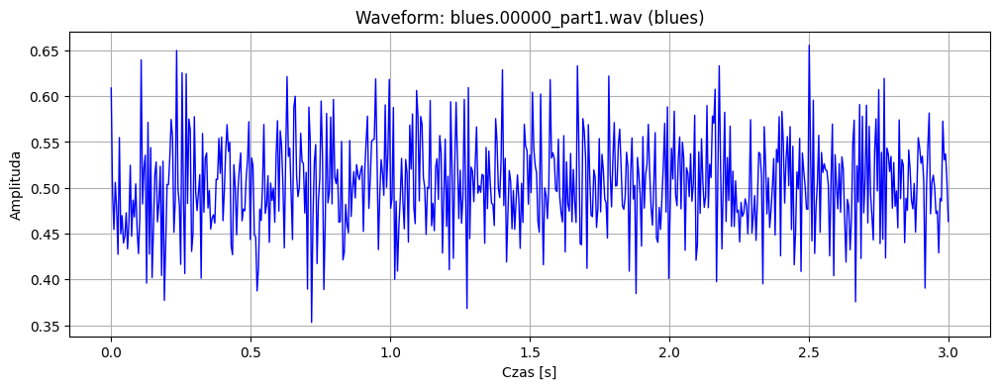

In [131]:
row = df_waveform.iloc[0]  # Możesz zmienić indeks na inny plik

# Pobranie nazwy pliku i etykiety
filename = row["filename"]
label = row["label"]

# Pobranie wartości amplitudy
samples = row.iloc[2:].values  # Pomijamy kolumny "filename" i "label"
# Tworzenie osi czasu (zakładając stałą częstotliwość próbkowania)
time = np.linspace(0, len(samples) / sr, len(samples))  # Oś czasu w sekundach
# Rysowanie wykresu
plt.figure(figsize=(12, 4))
plt.plot(time, samples, linewidth=1, color="blue")
plt.title(f"Waveform: {filename} ({label})")
plt.xlabel("Czas [s]")
plt.ylabel("Amplituda")
plt.grid()
plt.show()

## MFCC

In [95]:
# Ścieżka do folderu z danymi
DATASET_PATH = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/genres_split"

# Nowa częstotliwość próbkowania (zmniejszenie dokładności)
new_sr = 5025  # Nowa częstotliwość próbkowania (np. połowa oryginalnej)

# Liczba piosenek do wczytania
num_songs_to_process = 100  # Ustal liczbę piosenek, które chcesz przetworzyć

# Lista cech do zapisania (dane MFCC)
features = []

# Licznik przetworzonych piosenek
song_count = 0

# Przechodzimy przez foldery i pliki
for label in os.listdir(DATASET_PATH):
    label_path = os.path.join(DATASET_PATH, label)
    
    if not os.path.isdir(label_path):  # Sprawdzamy, czy to folder
        continue
    
    files = sorted(
        [f for f in os.listdir(label_path) if f.endswith('.wav')],
        key=lambda x: [int(num) if num.isdigit() else num for num in re.findall(r'\d+|\D+', x)]
    )

    for file in files:
        if file.endswith('.wav') and song_count < num_songs_to_process:  # Obsługujemy pliki audio i sprawdzamy licznik
            file_path = os.path.join(label_path, file)

            # Wczytanie pliku audio z nową częstotliwością próbkowania
            signal, sr = librosa.load(file_path, sr=new_sr)  # Wczytanie z nowym sample rate

            # Obliczenie MFCC
            mfcc = librosa.feature.mfcc(y=signal, sr=sr, n_mfcc=13, hop_length = 100)  # 13 współczynników MFCC
            mfcc = np.array(mfcc, dtype=float)  # Upewniamy się, że MFCC jest typu float
            
            # Dodanie cech do listy
            features.append([file, label] + list(mfcc.flatten()))  # Dodajemy MFCC do listy

            # Zwiększenie licznika piosenek
            #song_count += 1

        # Jeśli osiągnięto liczbę piosenek, przerywamy
        #if song_count >= num_songs_to_process:
            #break

    # Jeśli osiągnięto liczbę piosenek, przerywamy
    #if song_count >= num_songs_to_process:
       # break

# Tworzenie DataFrame z próbkami w czasie
columns = ["filename", "label"] + [f"mfcc_{i+1}" for i in range(13*len(mfcc[0]))]  # Kolumny = MFCC
df = pd.DataFrame(features, columns=columns)

# Zapis do CSV
csv_path = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/mfcc_data.csv"
df.to_csv(csv_path, index=False)

print(f"Zapisano dane do: {csv_path}")

Zapisano dane do: data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/mfcc_data.csv


In [96]:
df = pd.read_csv("data\\datasets\\andradaolteanu\\gtzan-dataset-music-genre-classification\\versions\\1\\Data\\mfcc_data.csv")
df.head(3)

,filename,label,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,...,mfcc_1954,mfcc_1955,mfcc_1956,mfcc_1957,mfcc_1958,mfcc_1959,mfcc_1960,mfcc_1961,mfcc_1962,mfcc_1963
0,blues.00000_part1.wav,blues,-139.815140,-121.808670,-107.422508,-95.524811,-83.730125,-70.213989,-55.175091,-40.011845,...,-5.960588,-4.002849,-2.348870,-1.009631,0.003295,0.574028,0.564590,0.183358,-0.196393,-0.419030
1,blues.00000_part2.wav,blues,-70.995651,-43.722763,-21.418215,-3.441116,10.900765,22.055082,30.105030,34.967789,...,0.534953,0.628785,0.122597,-1.164497,-2.699081,-4.263110,-5.775767,-7.182681,-8.451166,-9.560072
2,blues.00000_part3.wav,blues,-89.369316,-84.111961,-82.683716,-84.894440,-90.584457,-99.468246,-111.105522,-124.845779,...,-6.500289,-5.805757,-4.714828,-4.072700,-3.792083,-3.803374,-4.034116,-4.411366,-4.870187,-5.355404


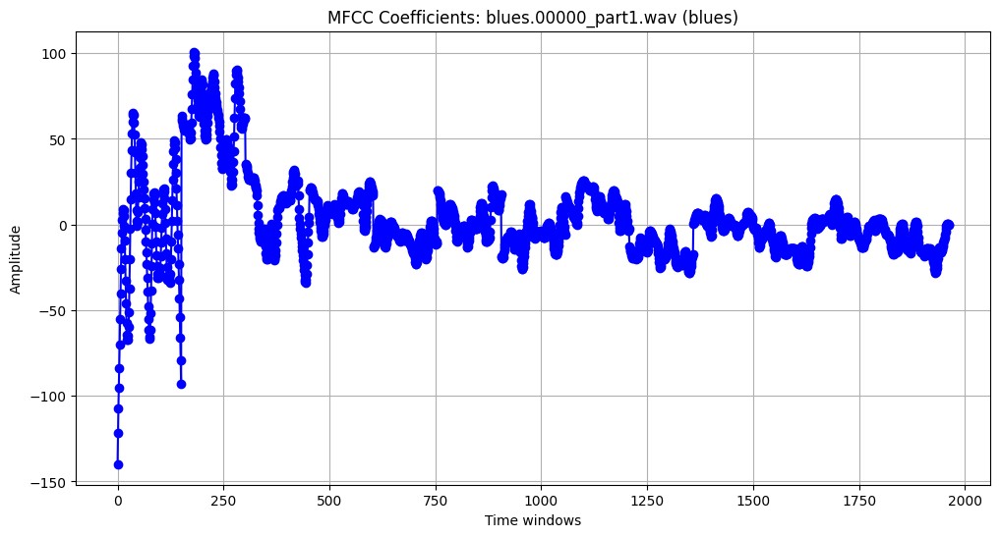

In [97]:
# Wybór pliku do wizualizacji (np. pierwszy wiersz)
row = df.iloc[0]  # Możesz zmienić indeks na inny plik
# Pobranie nazwy pliku i etykiety
filename = row["filename"]
label = row["label"]

# Pobranie wartości współczynników MFCC
mfcc_values = row.iloc[2:].values  # Pomijamy kolumny "filename" i "label"

# Wizualizacja współczynników MFCC
plt.figure(figsize=(12, 6))
plt.plot(mfcc_values, marker='o', color='b')
plt.title(f"MFCC Coefficients: {filename} ({label})")
plt.xlabel('Time windows')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

In [98]:
df_MFCC = df 
df_MFCC.head(20)

,filename,label,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,...,mfcc_1954,mfcc_1955,mfcc_1956,mfcc_1957,mfcc_1958,mfcc_1959,mfcc_1960,mfcc_1961,mfcc_1962,mfcc_1963
0,blues.00000_part1.wav,blues,-139.815140,-121.808670,-107.422508,-95.524811,-83.730125,-70.213989,-55.175091,-40.011845,...,-5.960588,-4.002849,-2.348870,-1.009631,0.003295,0.574028,0.564590,0.183358,-0.196393,-0.419030
1,blues.00000_part2.wav,blues,-70.995651,-43.722763,-21.418215,-3.441116,10.900765,22.055082,30.105030,34.967789,...,0.534953,0.628785,0.122597,-1.164497,-2.699081,-4.263110,-5.775767,-7.182681,-8.451166,-9.560072
2,blues.00000_part3.wav,blues,-89.369316,-84.111961,-82.683716,-84.894440,-90.584457,-99.468246,-111.105522,-124.845779,...,-6.500289,-5.805757,-4.714828,-4.072700,-3.792083,-3.803374,-4.034116,-4.411366,-4.870187,-5.355404
3,blues.00000_part4.wav,blues,-46.650112,-38.399799,-33.136028,-30.197508,-28.957773,-28.851862,-29.348751,-30.062595,...,-10.600206,-9.987734,-9.226098,-8.634652,-8.602678,-9.186848,-10.200985,-11.391977,-12.589170,-13.928978
4,blues.00000_part5.wav,blues,-28.812666,-17.325106,-9.332418,-4.519215,-2.338336,-1.317583,1.042504,5.996278,...,-17.159740,-18.020842,-18.177006,-17.742100,-16.907436,-15.973516,-15.046787,-14.206585,-13.503065,-12.979803
5,blues.00000_part6.wav,blues,-42.948681,-27.033476,-13.398163,-2.202888,6.379831,12.238650,15.334056,15.729300,...,-8.762891,-8.157424,-6.615470,-4.925100,-3.409456,-2.281649,-1.525218,-1.020357,-0.619443,-0.245054
6,blues.00000_part7.wav,blues,-47.135681,-40.794155,-38.160583,-38.967876,-42.967258,-49.769920,-58.183807,-64.013870,...,-10.960517,-11.481173,-11.923124,-12.241137,-12.549191,-12.923206,-13.355562,-13.793442,-14.160149,-14.367474
7,blues.00000_part8.wav,blues,-56.391521,-49.442036,-44.898827,-42.491859,-41.914585,-42.802578,-44.659046,-46.125874,...,-19.020393,-20.618328,-22.059429,-22.790417,-22.529032,-21.273720,-19.177927,-16.580029,-13.792006,-11.066866
8,blues.00000_part9.wav,blues,-44.424023,-31.455292,-20.117931,-10.232081,-1.763168,5.272473,10.870173,15.116275,...,-8.702600,-9.306291,-8.738187,-7.892241,-7.049171,-6.407845,-6.009184,-5.699478,-5.334979,-4.894980
9,blues.00000_part10.wav,blues,-37.677727,-23.379585,-12.499620,-4.813301,-0.035223,2.203985,2.300938,0.470128,...,-12.470049,-12.835722,-13.129099,-13.154705,-12.890491,-12.375360,-11.685408,-10.930782,-10.224633,-9.642624


In [99]:
#Normalizacja do przedziału [0,1]
scaler = MinMaxScaler()
df_MFCC.iloc[:, 2:] = scaler.fit_transform(df_MFCC.iloc[:, 2:])
df_MFCC.head(20)

,filename,label,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,...,mfcc_1954,mfcc_1955,mfcc_1956,mfcc_1957,mfcc_1958,mfcc_1959,mfcc_1960,mfcc_1961,mfcc_1962,mfcc_1963
0,blues.00000_part1.wav,blues,0.682725,0.690566,0.702050,0.712635,0.723535,0.739582,0.759659,0.775858,...,0.515495,0.520726,0.515577,0.510526,0.505554,0.490403,0.475212,0.472424,0.467956,0.462969
1,blues.00000_part2.wav,blues,0.772439,0.792601,0.813273,0.830924,0.844385,0.857223,0.868519,0.871181,...,0.565915,0.556026,0.534670,0.509299,0.483288,0.449451,0.421406,0.411002,0.399426,0.386736
2,blues.00000_part3.wav,blues,0.748487,0.739824,0.734043,0.726291,0.714782,0.702284,0.688265,0.668007,...,0.511306,0.506985,0.497298,0.486246,0.474282,0.453343,0.436186,0.434111,0.429155,0.421801
3,blues.00000_part4.wav,blues,0.804176,0.799557,0.798119,0.796553,0.793483,0.792318,0.792627,0.788507,...,0.479481,0.475111,0.462445,0.450084,0.434646,0.407765,0.383852,0.375903,0.365073,0.350300
4,blues.00000_part5.wav,blues,0.827429,0.827095,0.828903,0.829539,0.827478,0.827424,0.831421,0.834349,...,0.428565,0.413886,0.393293,0.377890,0.366220,0.350308,0.342729,0.352433,0.357486,0.358216
5,blues.00000_part6.wav,blues,0.809001,0.814409,0.823645,0.832514,0.838612,0.844708,0.849664,0.846723,...,0.493743,0.489061,0.482614,0.479489,0.477435,0.466227,0.457477,0.462387,0.464444,0.464420
6,blues.00000_part7.wav,blues,0.803543,0.796428,0.791621,0.785287,0.775592,0.765648,0.755819,0.745344,...,0.476685,0.463729,0.441609,0.421496,0.402129,0.376132,0.357081,0.355878,0.352031,0.346643
7,blues.00000_part8.wav,blues,0.791477,0.785128,0.782907,0.780760,0.776936,0.774531,0.773083,0.768085,...,0.414122,0.394089,0.363299,0.337873,0.319901,0.305435,0.307670,0.332642,0.355087,0.374169
8,blues.00000_part9.wav,blues,0.807078,0.808631,0.814954,0.822200,0.828212,0.835826,0.843966,0.845943,...,0.494211,0.480305,0.466215,0.455969,0.447446,0.431293,0.419425,0.423370,0.425296,0.425641
9,blues.00000_part10.wav,blues,0.815872,0.819184,0.824807,0.829161,0.830419,0.831914,0.833027,0.827324,...,0.464967,0.453405,0.432292,0.414254,0.399317,0.380771,0.371254,0.379748,0.384703,0.386047


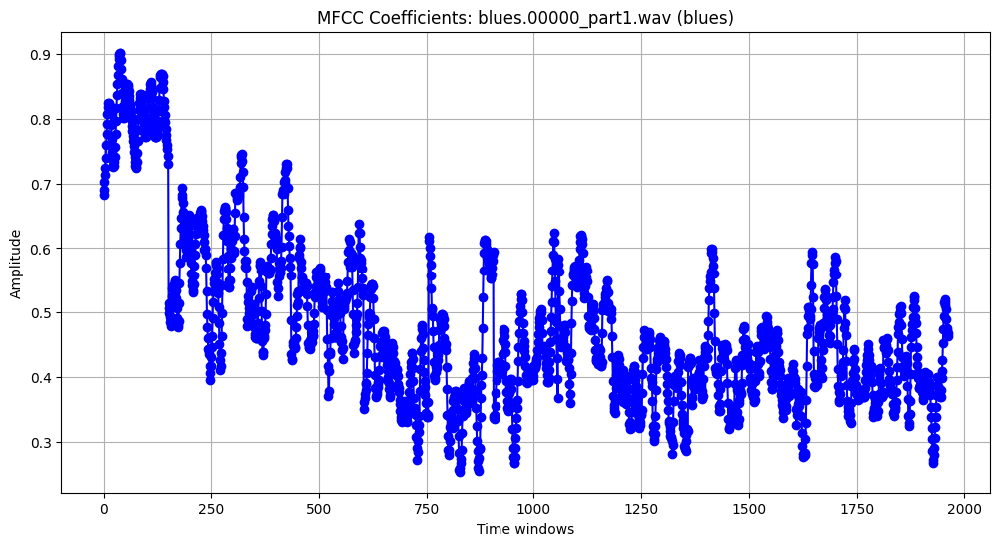

In [100]:
# Wybór pliku do wizualizacji (np. pierwszy wiersz)
row = df_MFCC.iloc[0]  # Możesz zmienić indeks na inny plik
# Pobranie nazwy pliku i etykiety
filename = row["filename"]
label = row["label"]

# Pobranie wartości współczynników MFCC
mfcc_values = row.iloc[2:].values  # Pomijamy kolumny "filename" i "label"

# Wizualizacja współczynników MFCC
plt.figure(figsize=(12, 6))
plt.plot(mfcc_values, marker='o', color='b')
plt.title(f"MFCC Coefficients: {filename} ({label})")
plt.xlabel('Time windows')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

## Audio Frequency Spectrum

In [17]:
# Ścieżka do datasetu
DATASET_PATH = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/genres_split"

# Nowa częstotliwość próbkowania
new_sr = 5025  

# Liczba piosenek do przetworzenia
num_songs_to_process = 100  

# Lista cech
features = []

# Przetwarzanie plików
for label in os.listdir(DATASET_PATH):
    label_path = os.path.join(DATASET_PATH, label)
    
    if not os.path.isdir(label_path):
        continue
    
    files = sorted(
        [f for f in os.listdir(label_path) if f.endswith('.wav')],
        key=lambda x: [int(num) if num.isdigit() else num for num in re.findall(r'\d+|\D+', x)]
    )

    for file in files:
       # if len(features) >= num_songs_to_process:
            #break  # Ograniczenie do określonej liczby piosenek

        file_path = os.path.join(label_path, file)

        # Wczytanie pliku audio
        signal, sr = librosa.load(file_path, sr=new_sr)

        # Obliczenie FFT
        fft_values = np.fft.fft(signal)  # FFT
        magnitude = np.abs(fft_values)  # Moduł wartości (bez fazy)
        magnitude = magnitude[:len(magnitude) // 2]  # Bierzemy tylko połowę (symetryczna właściwość FFT)

        # Dodanie do listy cech
        features.append([file, label] + list(magnitude))

# Tworzenie DataFrame
columns = ["filename", "label"] + [f"freq_{i}" for i in range(len(features[0]) - 2)]
df = pd.DataFrame(features, columns=columns)

# Zapis do CSV
csv_path = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/frequency_spectrum_data.csv"
df.to_csv(csv_path, index=False)

print(f"Zapisano dane do: {csv_path}")


Zapisano dane do: data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/frequency_spectrum_data.csv


In [101]:
csv_path = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/frequency_spectrum_data.csv"
df = pd.read_csv(csv_path)

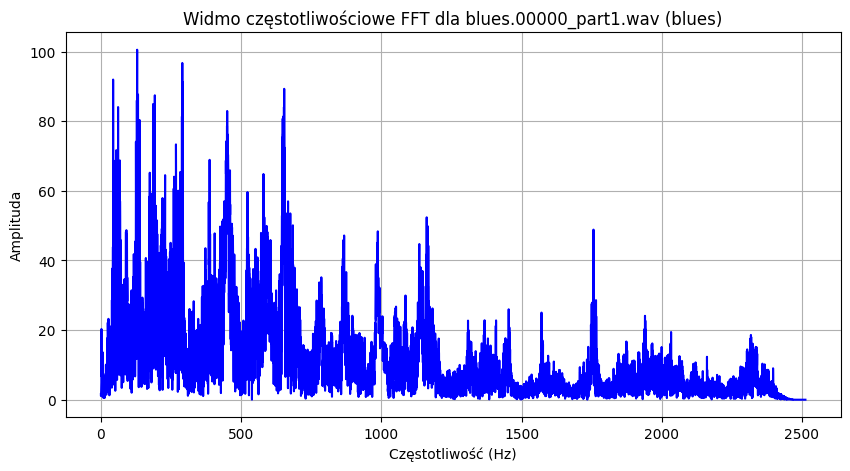

In [102]:
# Wybór jednej próbki (np. pierwszego pliku w DataFrame)
sample_row = df.iloc[0]  # Możesz zmienić indeks na inny utwór

# Pobranie nazwy pliku i etykiety gatunku
file_name = sample_row["filename"]
label = sample_row["label"]

# Pobranie wartości FFT (pomijamy pierwsze 2 kolumny, bo to nazwa pliku i gatunek)
fft_values = sample_row[2:].values.astype(float)  # Konwersja do float dla pewności

# Tworzenie osi częstotliwości
num_freqs = len(fft_values)
max_freq = 5025 / 2  # Maksymalna częstotliwość (Nyquist frequency)
frequencies = np.linspace(0, max_freq, num_freqs)

# Rysowanie wykresu
plt.figure(figsize=(10, 5))
plt.plot(frequencies, fft_values, color='blue')
plt.xlabel("Częstotliwość (Hz)")
plt.ylabel("Amplituda")
plt.title(f"Widmo częstotliwościowe FFT dla {file_name} ({label})")
plt.grid()
plt.show()

In [103]:
df_frequency_spectrum = df
df_frequency_spectrum.head(20)

,filename,label,freq_0,freq_1,freq_2,freq_3,freq_4,freq_5,freq_6,freq_7,...,freq_7527,freq_7528,freq_7529,freq_7530,freq_7531,freq_7532,freq_7533,freq_7534,freq_7535,freq_7536
0,blues.00000_part1.wav,blues,1.594105,1.058592,1.594808,2.555676,4.009449,5.013411,20.319494,6.772402,...,0.011056,0.011059,0.011054,0.011055,0.011056,0.011058,0.011056,0.011055,0.011061,0.011059
1,blues.00000_part2.wav,blues,2.137673,1.670606,2.336114,4.441958,1.976746,5.600151,17.552280,6.054579,...,0.093180,0.093174,0.093165,0.093159,0.093155,0.093151,0.093141,0.093144,0.093137,0.093139
2,blues.00000_part3.wav,blues,1.127163,2.196691,2.732020,1.121456,0.980083,3.728064,18.698835,8.266226,...,0.182544,0.182540,0.182528,0.182530,0.182525,0.182526,0.182518,0.182517,0.182518,0.182514
3,blues.00000_part4.wav,blues,0.003771,0.794800,3.053036,2.881639,3.119992,6.760142,10.383384,2.832041,...,0.140978,0.140978,0.140964,0.140962,0.140959,0.140954,0.140950,0.140946,0.140944,0.140940
4,blues.00000_part5.wav,blues,1.869367,1.826495,2.249452,2.083240,5.214778,7.583618,7.354880,14.743036,...,0.006465,0.006464,0.006463,0.006456,0.006454,0.006451,0.006450,0.006454,0.006451,0.006449
5,blues.00000_part6.wav,blues,1.585928,1.159302,1.807687,5.591736,2.014947,9.920523,14.895607,5.633248,...,0.067250,0.067243,0.067235,0.067218,0.067216,0.067212,0.067206,0.067198,0.067199,0.067197
6,blues.00000_part7.wav,blues,2.560513,3.257086,3.516930,4.929715,3.534358,2.342096,22.477772,4.834243,...,0.127450,0.127450,0.127452,0.127446,0.127446,0.127443,0.127443,0.127440,0.127443,0.127441
7,blues.00000_part8.wav,blues,2.069873,1.823556,1.701300,1.703907,2.917443,10.109203,15.271533,6.391989,...,0.150939,0.150920,0.150909,0.150888,0.150881,0.150875,0.150858,0.150857,0.150854,0.150852
8,blues.00000_part9.wav,blues,1.238833,1.116097,1.237663,1.555225,1.091417,2.172767,18.554514,8.545274,...,0.137737,0.137729,0.137726,0.137724,0.137726,0.137722,0.137721,0.137724,0.137720,0.137721
9,blues.00000_part10.wav,blues,0.791066,1.139601,1.989279,1.009458,1.985661,3.344337,19.730585,9.779736,...,0.084718,0.084719,0.084722,0.084720,0.084718,0.084715,0.084718,0.084719,0.084719,0.084720


In [104]:
scaler = MinMaxScaler()
df_frequency_spectrum.iloc[:, 2:] = scaler.fit_transform(df_frequency_spectrum.iloc[:, 2:])

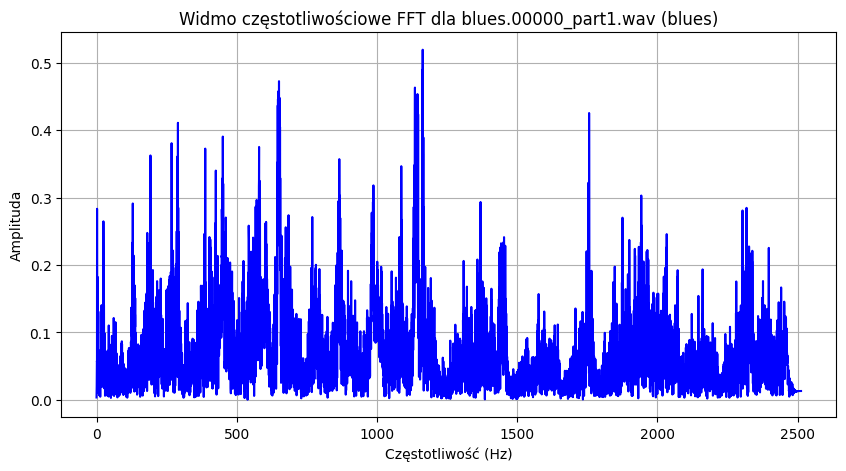

In [105]:
# Wybór jednej próbki (np. pierwszego pliku w DataFrame)
sample_row = df_frequency_spectrum.iloc[0]  # Możesz zmienić indeks na inny utwór

# Pobranie nazwy pliku i etykiety gatunku
file_name = sample_row["filename"]
label = sample_row["label"]

# Pobranie wartości FFT (pomijamy pierwsze 2 kolumny, bo to nazwa pliku i gatunek)
fft_values = sample_row[2:].values.astype(float)  # Konwersja do float dla pewności

# Tworzenie osi częstotliwości
num_freqs = len(fft_values)
max_freq = 5025 / 2  # Maksymalna częstotliwość (Nyquist frequency)
frequencies = np.linspace(0, max_freq, num_freqs)

# Rysowanie wykresu
plt.figure(figsize=(10, 5))
plt.plot(frequencies, fft_values, color='blue')
plt.xlabel("Częstotliwość (Hz)")
plt.ylabel("Amplituda")
plt.title(f"Widmo częstotliwościowe FFT dla {file_name} ({label})")
plt.grid()
plt.show()

## Chroma 

In [113]:
# Ścieżka do datasetu
DATASET_PATH = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/genres_split"

# Nowa częstotliwość próbkowania
new_sr = 5025  

# Liczba piosenek do przetworzenia
num_songs_to_process = 100  

# Lista cech
features = []

# Przetwarzanie plików
for label in os.listdir(DATASET_PATH):
    label_path = os.path.join(DATASET_PATH, label)
    
    if not os.path.isdir(label_path):
        continue
    
    files = sorted(
        [f for f in os.listdir(label_path) if f.endswith('.wav')],
        key=lambda x: [int(num) if num.isdigit() else num for num in re.findall(r'\d+|\D+', x)]
    )

    for file in files:
        #if len(features) >= num_songs_to_process:
           # break  # Ograniczenie do określonej liczby piosenek

        file_path = os.path.join(label_path, file)

        # Wczytanie pliku audio
        signal, sr = librosa.load(file_path, sr=sr)
        
        chroma = librosa.feature.chroma_stft(y=signal, sr=sr)  # Obliczenie chromagramu
        
        # Dodanie do listy cech
        # Chroma Features to macierz 12xT, więc musimy ją spłaszczyć, by zapisać w jednym wierszu
        chroma_flattened = chroma.flatten()  # Spłaszczamy macierz do wektora
        features.append([file, label] + list(chroma_flattened))  # Dodanie nazwy pliku i etykiety
        
        # Tworzenie DataFrame
columns = ["filename", "label"] + [f"chroma_{i}" for i in range(len(features[0]) - 2)]  # 12 x T elementów
df = pd.DataFrame(features, columns=columns)

# Zapis do CSV
csv_path = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/chroma_full_matrix_data.csv"
df.to_csv(csv_path, index=False)

print(f"Zapisano dane do: {csv_path}")
        

c:\Users\Komputer\Desktop\studia-Informatyka\Koła\Golem\projekt-rekrutacja\Music-Genre-Classifier\.venv\Lib\site-packages\librosa\core\pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(


Zapisano dane do: data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/chroma_full_matrix_data.csv


In [114]:
df = pd.read_csv("data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/chroma_full_matrix_data.csv")
df.head(20)

,filename,label,chroma_0,chroma_1,chroma_2,chroma_3,chroma_4,chroma_5,chroma_6,chroma_7,...,chroma_350,chroma_351,chroma_352,chroma_353,chroma_354,chroma_355,chroma_356,chroma_357,chroma_358,chroma_359
0,blues.00000_part1.wav,blues,0.623780,0.414563,0.605249,0.590807,0.356979,0.789569,0.708129,0.388056,...,0.113116,0.310216,0.267666,0.174141,0.463781,0.234516,0.054540,0.017731,0.033673,0.207015
1,blues.00000_part2.wav,blues,0.251319,0.367307,0.286471,0.108958,1.000000,1.000000,0.668940,0.380217,...,0.431213,0.095212,0.114118,0.143452,0.369754,0.524224,0.741341,1.000000,1.000000,1.000000
2,blues.00000_part3.wav,blues,1.000000,1.000000,1.000000,1.000000,1.000000,0.669907,0.287536,0.241413,...,0.100763,0.142323,0.279565,0.693803,0.470644,0.267488,0.199431,0.075844,0.076266,0.050670
3,blues.00000_part4.wav,blues,0.134457,0.070977,0.022221,0.279702,0.215924,0.127966,0.954888,1.000000,...,0.528056,0.354975,0.950001,1.000000,1.000000,0.715114,0.409210,0.291517,0.378445,0.430431
4,blues.00000_part5.wav,blues,0.151394,0.124655,0.168831,0.108216,0.100309,0.112662,0.109998,0.138506,...,0.107376,0.201898,0.202809,0.053026,0.114647,0.327476,0.352356,0.300645,0.373159,0.530362
5,blues.00000_part6.wav,blues,0.071812,0.363051,0.285507,0.248962,0.371763,0.342743,0.028700,0.008629,...,0.376477,0.338616,0.167143,0.342588,0.416723,0.464104,0.408098,0.782803,0.867795,0.390459
6,blues.00000_part7.wav,blues,0.244227,0.287282,0.275764,0.182355,0.286631,0.343418,0.137451,0.168611,...,0.326016,0.360868,0.130381,0.153810,0.062653,0.054711,0.222398,0.261680,0.457901,0.294302
7,blues.00000_part8.wav,blues,0.039573,0.109922,0.284220,0.701890,1.000000,1.000000,1.000000,1.000000,...,0.288150,0.287471,0.067959,0.175299,0.585640,0.607347,0.340889,0.164409,0.064753,0.044842
8,blues.00000_part9.wav,blues,0.052400,0.297083,1.000000,0.617831,0.631269,1.000000,0.333688,0.059903,...,0.170842,0.223328,0.298161,0.275289,1.000000,1.000000,0.547190,0.313984,0.149426,0.091222
9,blues.00000_part10.wav,blues,0.381982,0.323149,0.187113,0.312550,0.285240,0.356640,0.192783,0.133215,...,0.566116,0.507370,0.425408,0.325029,0.533102,0.352300,0.267961,0.421667,0.887518,1.000000


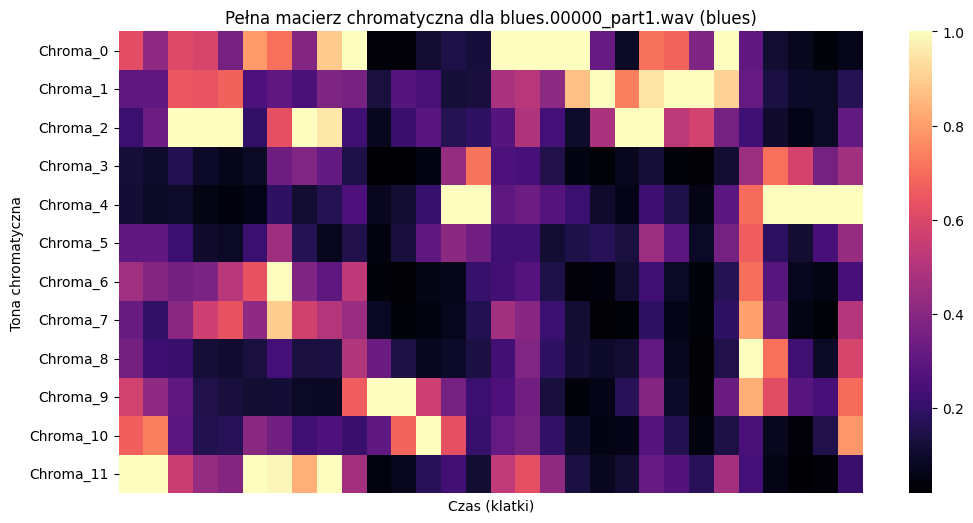

In [115]:
# Wybór jednej próbki (np. pierwszego pliku w DataFrame)
sample_row = df.iloc[0]  # Możesz zmienić indeks na inny utwór

# Pobranie nazwy pliku i etykiety gatunku
file_name = sample_row["filename"]
label = sample_row["label"]

# Pobranie wartości FFT (pomijamy pierwsze 2 kolumny, bo to nazwa pliku i gatunek)
chroma_values = sample_row[2:].values.astype(float)  # Konwersja do float dla pewności

# Liczba tonów chromatycznych (12)
num_chroma = 12

# Obliczanie liczby klatek czasowych
num_frames = len(chroma_values) // num_chroma

# Przekształcenie danych do macierzy 12 x T (gdzie T to liczba klatek)
chroma_matrix = chroma_values.reshape((num_chroma, num_frames))

# Rysowanie wykresu
plt.figure(figsize=(12, 6))
sns.heatmap(chroma_matrix, cmap="magma", xticklabels=False, yticklabels=[f"Chroma_{i}" for i in range(num_chroma)])
plt.title(f"Pełna macierz chromatyczna dla {file_name} ({label})")
plt.xlabel("Czas (klatki)")
plt.ylabel("Tona chromatyczna")
plt.show()

In [121]:
df_chroma = df
df_chroma.head(20)
print(df_chroma.min())
print(df_chroma.max())

filename      blues.00000_part1.wav
label                         blues
chroma_0                        0.0
chroma_1                        0.0
chroma_2                        0.0
                      ...          
chroma_355                 0.000235
chroma_356                 0.000308
chroma_357                 0.000353
chroma_358                 0.000312
chroma_359                 0.000246
Length: 362, dtype: object
filename      rock.00099_part9.wav
label                         rock
chroma_0                       1.0
chroma_1                       1.0
chroma_2                       1.0
                      ...         
chroma_355                     1.0
chroma_356                     1.0
chroma_357                     1.0
chroma_358                     1.0
chroma_359                     1.0
Length: 362, dtype: object


In [ ]:
#Dane dla chroomy już sa w zakresie [0,1] więc nie trzeba ich normalizować

## Łączenie i zapis końcowego df

In [132]:
dfs = [df_waveform, df_MFCC, df_chroma, df_frequency_spectrum]
df_complete = reduce(lambda left, right: pd.merge(left, right, on=["filename", "label"], how='outer'), dfs)

In [136]:
df_complete.head(20)

,filename,label,waveform_sample_0,waveform_sample_1,waveform_sample_2,waveform_sample_3,waveform_sample_4,waveform_sample_5,waveform_sample_6,waveform_sample_7,...,freq_7527,freq_7528,freq_7529,freq_7530,freq_7531,freq_7532,freq_7533,freq_7534,freq_7535,freq_7536
0,blues.00000_part1.wav,blues,0.608844,0.494128,0.454509,0.505920,0.476642,0.427330,0.554761,0.449868,...,0.013008,0.013012,0.013007,0.013010,0.013011,0.013014,0.013013,0.013017,0.013032,0.013036
1,blues.00000_part10.wav,blues,0.592141,0.512137,0.480465,0.481421,0.484591,0.438977,0.547321,0.455769,...,0.099948,0.099954,0.099960,0.099963,0.099965,0.099963,0.099968,0.099975,0.099984,0.099991
2,blues.00000_part2.wav,blues,0.593943,0.528386,0.445408,0.486017,0.479574,0.440738,0.564665,0.440815,...,0.109935,0.109933,0.109926,0.109924,0.109923,0.109921,0.109911,0.109920,0.109921,0.109930
3,blues.00000_part3.wav,blues,0.645587,0.568702,0.390340,0.448266,0.537188,0.487059,0.464966,0.414852,...,0.215407,0.215413,0.215405,0.215417,0.215419,0.215423,0.215417,0.215423,0.215433,0.215435
4,blues.00000_part4.wav,blues,0.635567,0.509260,0.442365,0.511749,0.476402,0.445900,0.561738,0.427092,...,0.166349,0.166357,0.166345,0.166351,0.166353,0.166350,0.166348,0.166349,0.166355,0.166357
5,blues.00000_part5.wav,blues,0.640346,0.512854,0.442165,0.503362,0.481789,0.433142,0.558233,0.440757,...,0.007589,0.007589,0.007588,0.007581,0.007579,0.007576,0.007575,0.007585,0.007591,0.007594
6,blues.00000_part6.wav,blues,0.607466,0.511739,0.486187,0.463042,0.464069,0.436483,0.596396,0.420006,...,0.079331,0.079327,0.079320,0.079304,0.079304,0.079301,0.079296,0.079292,0.079302,0.079306
7,blues.00000_part7.wav,blues,0.611037,0.531399,0.411036,0.494834,0.528726,0.410254,0.509133,0.494460,...,0.150382,0.150389,0.150396,0.150396,0.150402,0.150401,0.150403,0.150406,0.150418,0.150423
8,blues.00000_part8.wav,blues,0.597880,0.513916,0.462739,0.492172,0.475320,0.433129,0.566714,0.446477,...,0.178105,0.178091,0.178084,0.178067,0.178066,0.178061,0.178044,0.178049,0.178054,0.178059
9,blues.00000_part9.wav,blues,0.607488,0.513798,0.476087,0.497415,0.448981,0.435093,0.579323,0.431788,...,0.162524,0.162521,0.162523,0.162528,0.162537,0.162534,0.162537,0.162545,0.162550,0.162558


In [135]:
csv_path = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/CNN_complete_data.csv"
df_complete.to_csv(csv_path, index=False)

In [ ]:
csv_path = "data/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/versions/1/Data/CNN_complete_data.csv"
df_complete = pd.read_csv(csv_path)

In [137]:
print(df_complete.min())
print(df_complete.max())

filename             blues.00000_part1.wav
label                                blues
waveform_sample_0                      0.0
waveform_sample_1                      0.0
waveform_sample_2                      0.0
                             ...          
freq_7532                              0.0
freq_7533                              0.0
freq_7534                              0.0
freq_7535                              0.0
freq_7536                              0.0
Length: 10477, dtype: object
filename             rock.00099_part9.wav
label                                rock
waveform_sample_0                     1.0
waveform_sample_1                     1.0
waveform_sample_2                     1.0
                             ...         
freq_7532                             1.0
freq_7533                             1.0
freq_7534                             1.0
freq_7535                             1.0
freq_7536                             1.0
Length: 10477, dtype: object
